# QCTO - Workplace Module

### Project Title: Insurance Fraud Investigation
#### Done By: Ndumiso Biyela

© ExploreAI 2024

---

## Table of Contents

<a href=#BC> Background Context</a>

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Data Collection and Description</a>

<a href=#three>3. Loading Data </a>

<a href=#four>4. Data Cleaning and Filtering</a>

<a href=#five>5. Exploratory Data Analysis (EDA)</a>

<a href=#six>6. Modeling </a>

<a href=#seven>7. Evaluation and Validation</a>

<a href=#eight>8. Final Model</a>

<a href=#nine>9. Conclusion and Future Work</a>

<a href=#ten>10. References</a>

---
 <a id="BC"></a>
## **Background Context**
<a href=#cont>Back to Table of Contents</a>

Insurance plays a vital role in the economy by providing financial security and stability, which enables economic growth and development.Insurance fraud not only affects insurance companies but also has broader economic and social impacts, leading to higher costs for consumers, financial instability, and reduced accessibility to insurance.

Insurance fraud occurs when individuals collaborate to submit false or inflated claims for property damage or personal injuries after an accident. Common tactics include orchestrating accidents intentionally, using ‘phantom passengers’ who were not present at the scene but claim severe injuries, and exaggerating the extent of personal injuries to receive higher compensation

---
<a href=#one></a>
## **Importing Packages**
<a href=#cont>Back to Table of Contents</a>


The packages used in this project include:
            -Numpy and Pandas for data manipulation.
            -Matplotlib/Seaborn for visualization.
            -Scikit-learn for modeling


In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import requests
import matplotlib.pyplot as plt

---
<a href=#two></a>
## **Data Collection and Description**
<a href=#cont>Back to Table of Contents</a>

### About the dataset

This dataset was collected from https://github.com/NdumisoBiyela/Public-Data github repository.

The dataset contains the details about various insurance claims and whether they was fraud reported on the claim or not.

### Key Dataset Features:

policy_bind_date: Starting date of the insurance policy.

policy_csl: Combined Single Limits - This is the maximum value of the insurer will pay out per incident.

policy_annual_premium: The total dollar amount for the yearly premium.

umbrella_limit: Extra insurance that provides protection beyond existing limits and coverages of other policies.

auto_make: Vehicle brand.

auto_model: Vehicle model.

insured_education_level: Highest qualification of the insurer.

policy_deductable: Excess payment before a payout or service is conducted.

insured_occupation: The profession in which the insurer works.

Fraud_reported: Y - a fraudelent or false claim, N - a legit and valid claim.


---
<a href=#three></a>
## **Loading Data**
<a href=#cont>Back to Table of Contents</a>


In [2]:
dataset = pd.read_csv('insurance_claims_raw.csv')

In [3]:
dataset.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
count,1000.000000,998.000000,1000.000000,998.000000,997.000000,1.000000e+03,1000.000000,998.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,996.000000,999.000000,999.000000,1000.000000,1000.000000,0.0
mean,203.954000,38.962926,546238.648000,1134.268537,1257.001113,1.101000e+06,501214.488000,25176.452906,-26793.700000,11.644000,1.83900,0.992000,1.487000,52767.469880,7434.944945,7398.628629,37928.950000,2005.103000,NaN
std,115.113174,9.135425,257063.005276,611.251914,244.265051,2.297407e+06,71701.610941,27877.379027,28104.096686,6.951373,1.01888,0.820127,1.111335,26405.348039,4883.158265,4827.050887,18886.252893,6.015861,NaN
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.000000,0.000000,0.000000,70.000000,1995.000000,NaN
25%,115.750000,32.000000,335980.250000,500.000000,1090.320000,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.500000,4290.000000,4440.000000,30292.500000,2000.000000,NaN
50%,199.500000,38.000000,533135.000000,1000.000000,1257.830000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,57935.000000,6780.000000,6750.000000,42100.000000,2005.000000,NaN
75%,276.250000,44.000000,759099.750000,2000.000000,1415.740000,0.000000e+00,603251.000000,51075.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70620.000000,11310.000000,10890.000000,50822.500000,2010.000000,NaN
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.000000,21450.000000,23670.000000,79560.000000,2015.000000,NaN


In [61]:
dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   float64
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   float64
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

---
<a href=#four></a>
## **Data Cleaning and Filtering**
<a href=#cont>Back to Table of Contents</a>

This section shows how the dataset was cleaned by handling missing values and removing outliers.

In [4]:
dataset.isna().sum()

months_as_customer                0
age                               2
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 2
policy_annual_premium             3
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           1
insured_occupation                0
insured_hobbies                   2
insured_relationship              0
capital-gains                     2
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             2
incident_state                    2
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

In [5]:
dataset.drop('_c39', axis=1, inplace=True)

In [6]:
def fill_missing_values(df):
    for column in df.columns:
        if df[column].dtype in ['float64', 'int64']:
            # Fill NaN with mean for numeric columns
            df[column].fillna(df[column].mean(), inplace=True)
        else:
            # Fill NaN with mode for categorical columns
            df[column].fillna(df[column].mode()[0], inplace=True)
    return df

In [7]:
dataset = fill_missing_values(dataset)


In [8]:
dataset.isna().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

In [9]:
duplicates = dataset[dataset.duplicated()]
print(duplicates)

Empty DataFrame
Columns: [months_as_customer, age, policy_number, policy_bind_date, policy_state, policy_csl, policy_deductable, policy_annual_premium, umbrella_limit, insured_zip, insured_sex, insured_education_level, insured_occupation, insured_hobbies, insured_relationship, capital-gains, capital-loss, incident_date, incident_type, collision_type, incident_severity, authorities_contacted, incident_state, incident_city, incident_location, incident_hour_of_the_day, number_of_vehicles_involved, property_damage, bodily_injuries, witnesses, police_report_available, total_claim_amount, injury_claim, property_claim, vehicle_claim, auto_make, auto_model, auto_year, fraud_reported]
Index: []

[0 rows x 39 columns]


In [10]:
def identify_outliers(df):
    outlier_columns = []
    for column in df.select_dtypes(include=['float64', 'int64']).columns:
        Q1 = df[column].quantile(0.25)
        Q3 = df[column].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - 1.5 * IQR
        upper_bound = Q3 + 1.5 * IQR
        if df[(df[column] < lower_bound) | (df[column] > upper_bound)].shape[0] > 0:
            outlier_columns.append(column)
    return outlier_columns
    

In [11]:
outliers = identify_outliers(dataset)

In [12]:
print(outliers)

['age', 'policy_annual_premium', 'umbrella_limit', 'total_claim_amount', 'property_claim']


---
<a href=#five></a>
## **Exploratory Data Analysis (EDA)**
<a href=#cont>Back to Table of Contents</a>

* **Purpose:** Explore and visualize the data to uncover patterns, trends, and relationships.
* **Details:** Use statistics and visualizations to explore the data. This may include histograms, box plots, scatter plots, and correlation matrices. Discuss any significant findings.
---


In [23]:
dataset.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported'],
      dtype='object')

<AxesSubplot:xlabel='insured_hobbies', ylabel='count'>

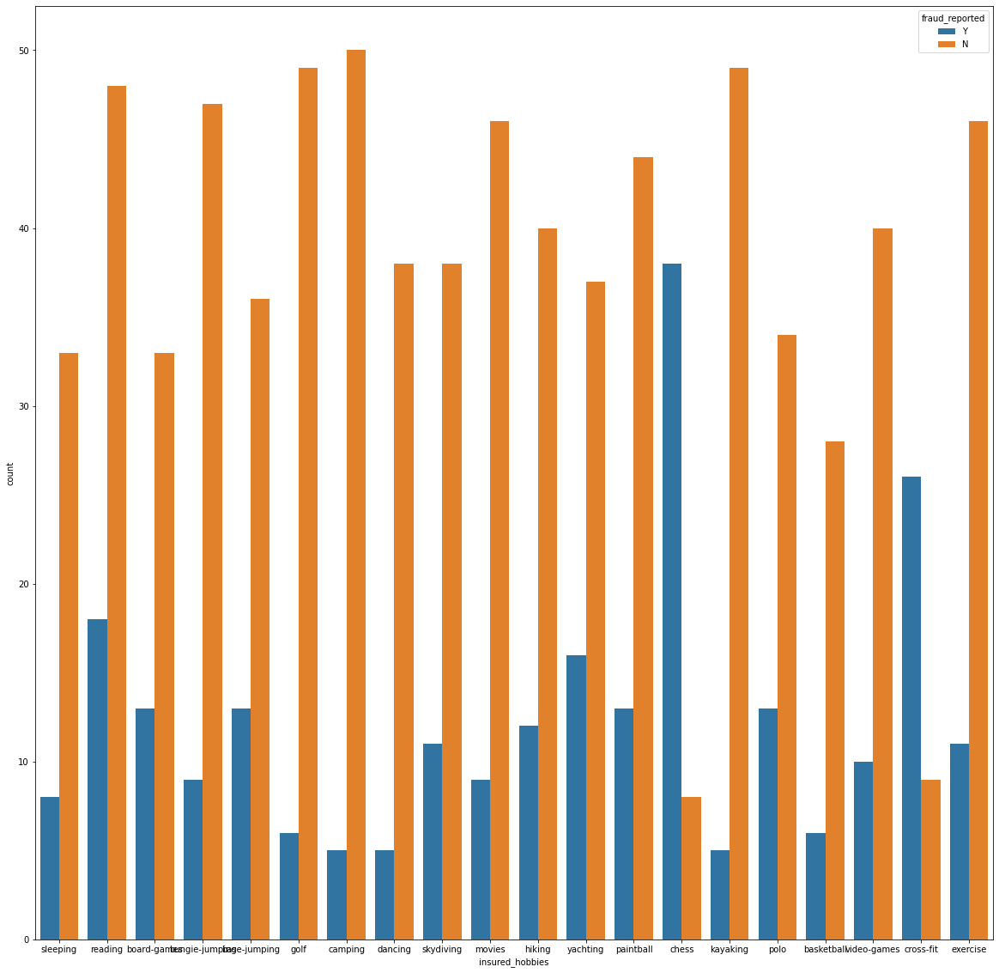

In [24]:
f, ax = plt.subplots(figsize=(20, 20))
sns.countplot(x='insured_hobbies',hue='fraud_reported',data=dataset)

<AxesSubplot:xlabel='insured_education_level', ylabel='count'>

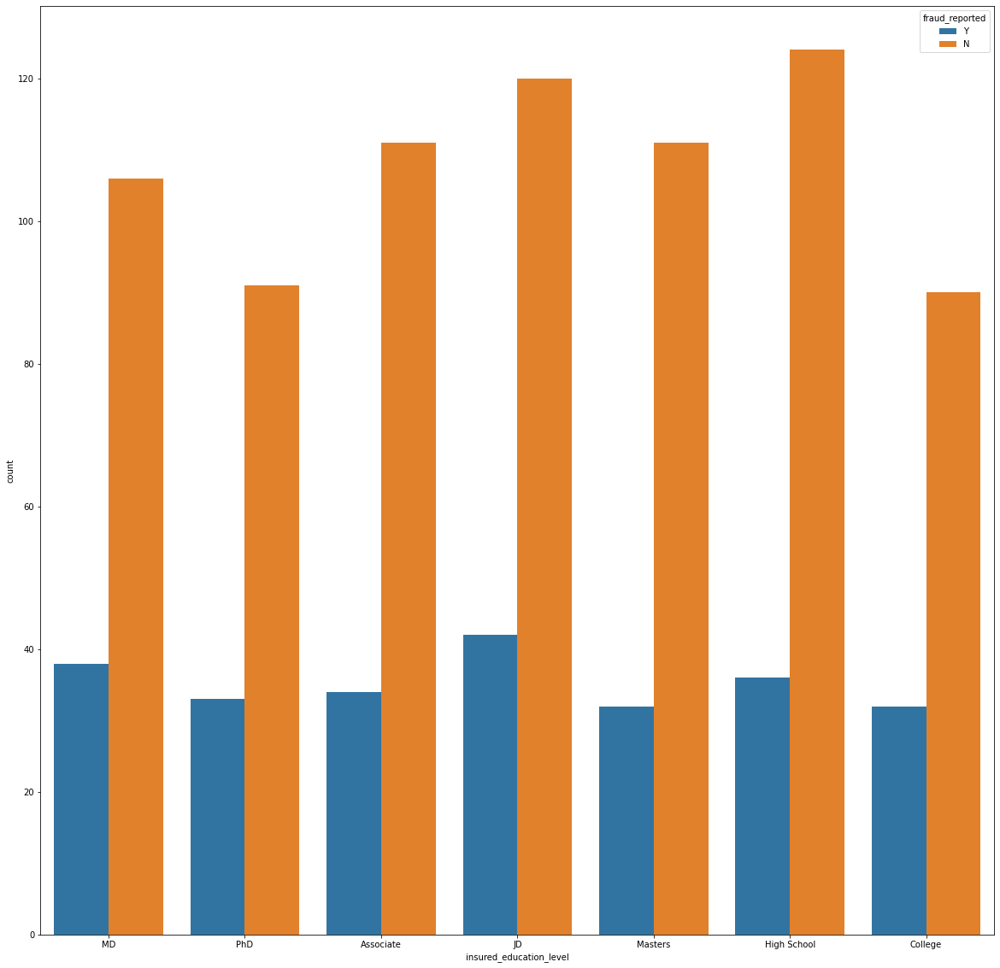

In [26]:
f, ax = plt.subplots(figsize=(20, 20))
sns.countplot(x='insured_education_level',hue='fraud_reported',data=dataset)

<AxesSubplot:xlabel='auto_make', ylabel='count'>

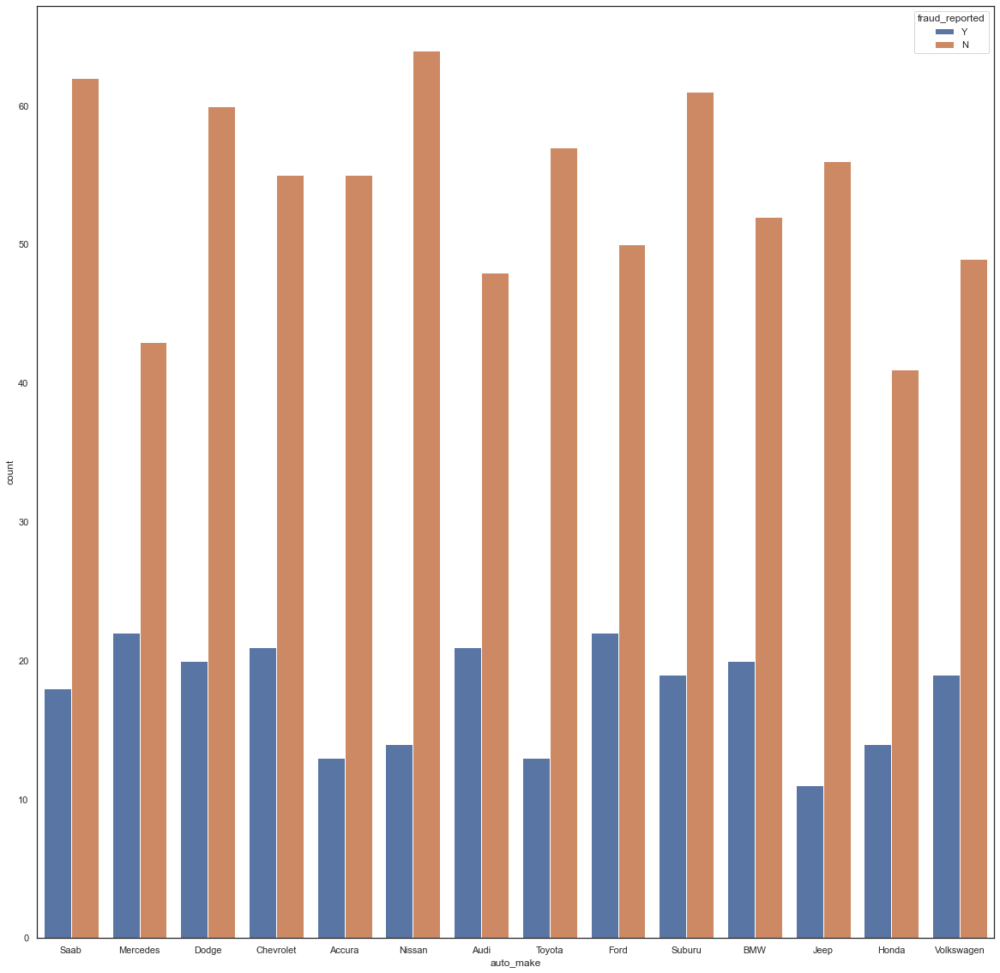

In [52]:
f, ax = plt.subplots(figsize=(20, 20))
sns.countplot(x='auto_make',hue='fraud_reported',data=dataset)

<AxesSubplot:xlabel='incident_state', ylabel='count'>

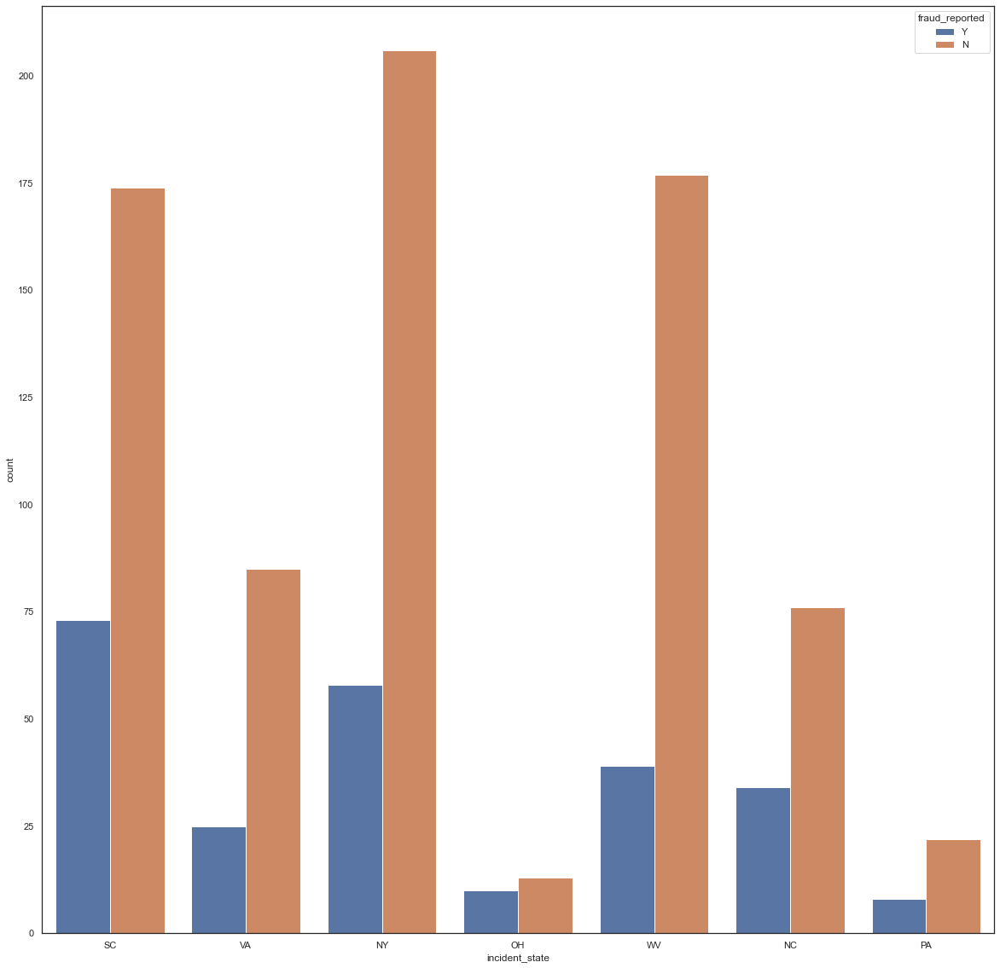

In [56]:
f, ax = plt.subplots(figsize=(20, 20))
sns.countplot(x='incident_state',hue='fraud_reported',data=dataset)

<AxesSubplot:xlabel='fraud_reported', ylabel='count'>

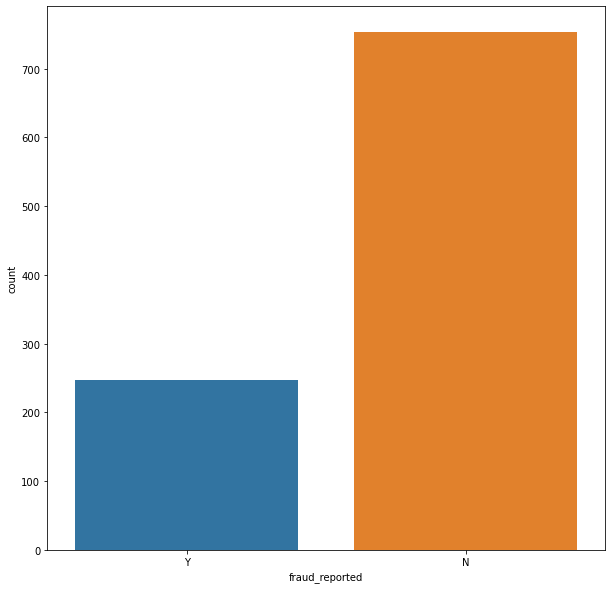

In [28]:
f, ax = plt.subplots(figsize=(10, 10))
sns.countplot(x='fraud_reported',data=dataset)

C:\Users\f5481198\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


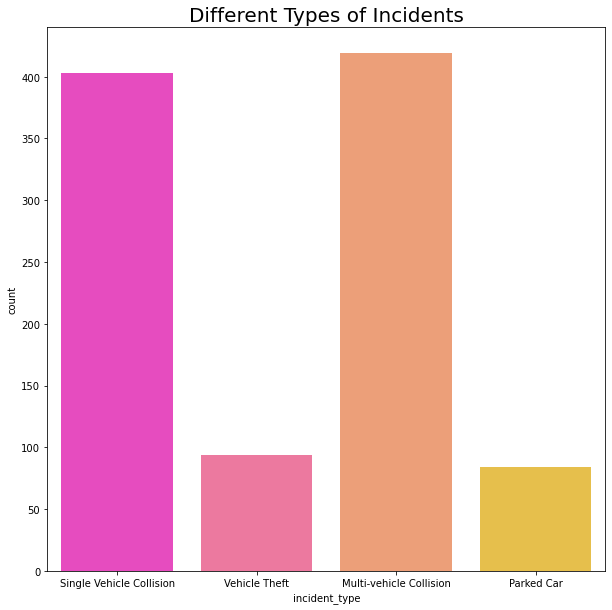

In [30]:
f, ax = plt.subplots(figsize=(10, 10))
sns.countplot(dataset['incident_type'], palette = 'spring')
plt.title('Different Types of Incidents', fontsize = 20)
plt.show()

In [43]:
# Identify numeric columns
dataset.drop(columns=['policy_number'])
numeric_columns = dataset.select_dtypes(include=['number']).columns
numeric_columns
numeric_dataset=dataset[numeric_columns]

In [44]:
def draw_distribution_plots(df):
    #numeric_columns = df.select_dtypes(include=['number']).columns
    plt.figure(figsize=(30,20))
    for i,col in enumerate(numeric_columns,1):
        plt.subplot(6,5,i)
        sns.histplot(df[col],kde =True)
        f= plt.gca()
        f.set_title(numeric_columns.values[i-1])
    
    plt.xticks(rotation=45)

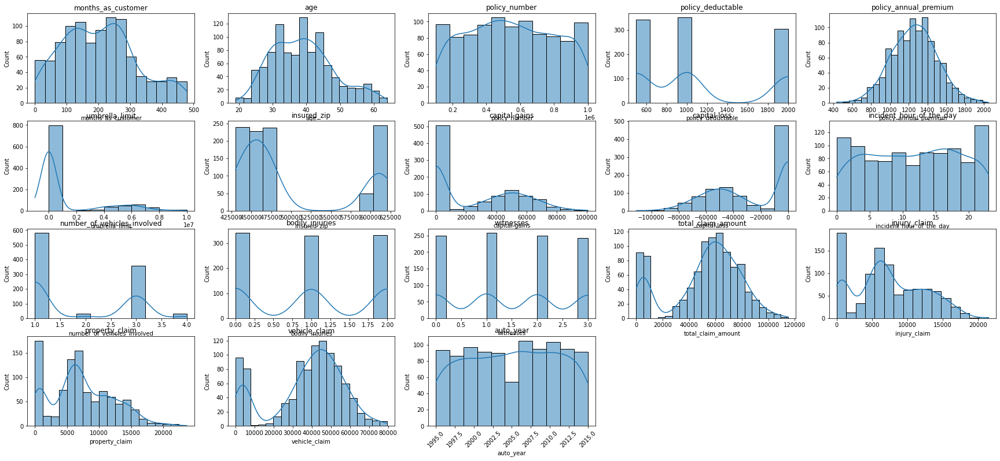

In [45]:
draw_distribution_plots(numeric_dataset)

C:\Users\f5481198\AppData\Local\Temp\ipykernel_14120\2030329820.py:3: DeprecationWarning: `np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  mask = np.zeros_like(corr,dtype=np.bool)


<AxesSubplot:>

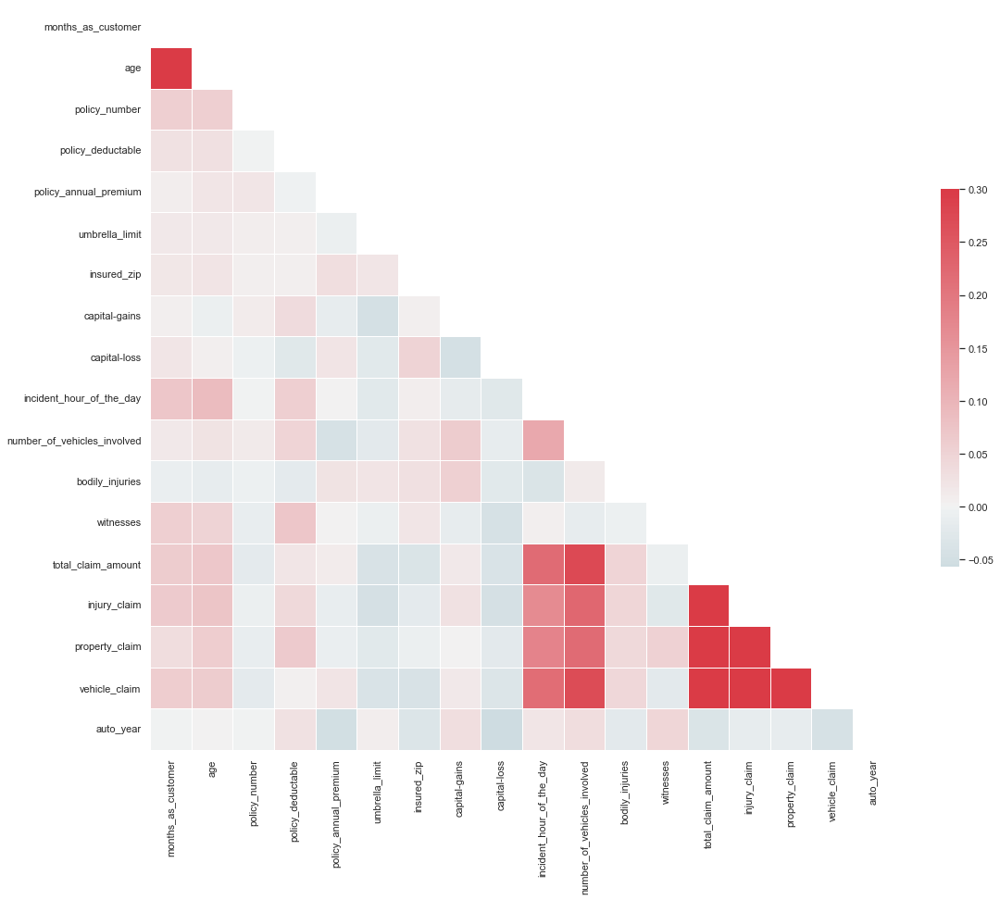

In [46]:
corr = dataset[numeric_columns].corr()
sns.set(style='white')
mask = np.zeros_like(corr,dtype=np.bool)
mask[np.triu_indices_from(mask)]=True
f, ax =plt.subplots(figsize=(18,15))
cmap =sns.diverging_palette(220,10, as_cmap=True)
sns.heatmap(corr, mask=mask,cmap=cmap, vmax=.3,center=0,square=True,linewidths=.5,cbar_kws={"shrink": .5})

C:\Users\f5481198\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\f5481198\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\f5481198\Anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(
C:\Users\f5481198\Anac

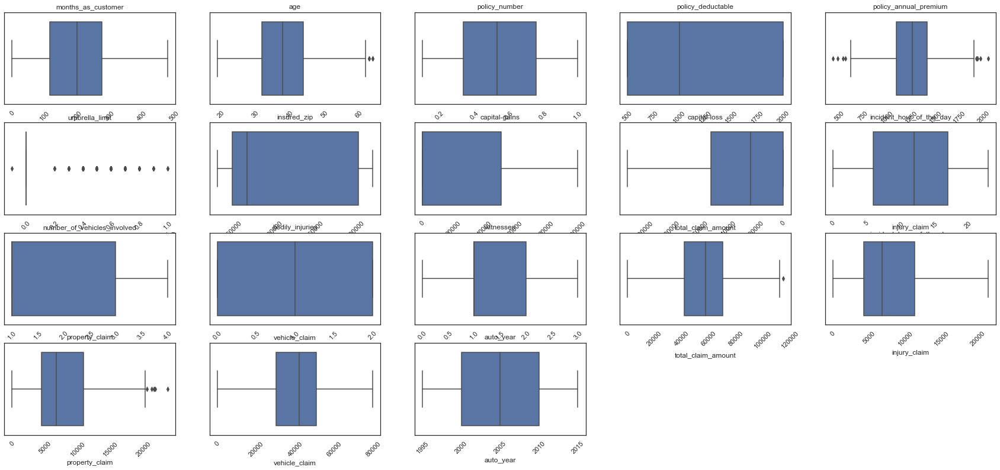

In [47]:
plt.figure(figsize=(30,20))
for i,col in enumerate(numeric_columns,1):
    plt.subplot(6,5,i)
    sns.boxplot(dataset[col])
    f= plt.gca()
    f.set_title(numeric_columns.values[i-1])
    
    plt.xticks(rotation=45)

In [48]:
def draw_scatter_plots(df):
    numeric_columns = df.select_dtypes(include=['number']).columns
    num_columns = len(numeric_columns)
    
    fig, axes = plt.subplots(nrows=num_columns, ncols=num_columns, figsize=(5 * num_columns, 5 * num_columns))
    
    for i, col1 in enumerate(numeric_columns):
        for j, col2 in enumerate(numeric_columns):
            if i != j:
                sns.scatterplot(x=df[col1], y=df[col2], ax=axes[i, j])
                axes[i, j].set_title(f'{col1} vs {col2}')
            else:
                axes[i, j].set_visible(False)
    
    plt.tight_layout()
    plt.show()

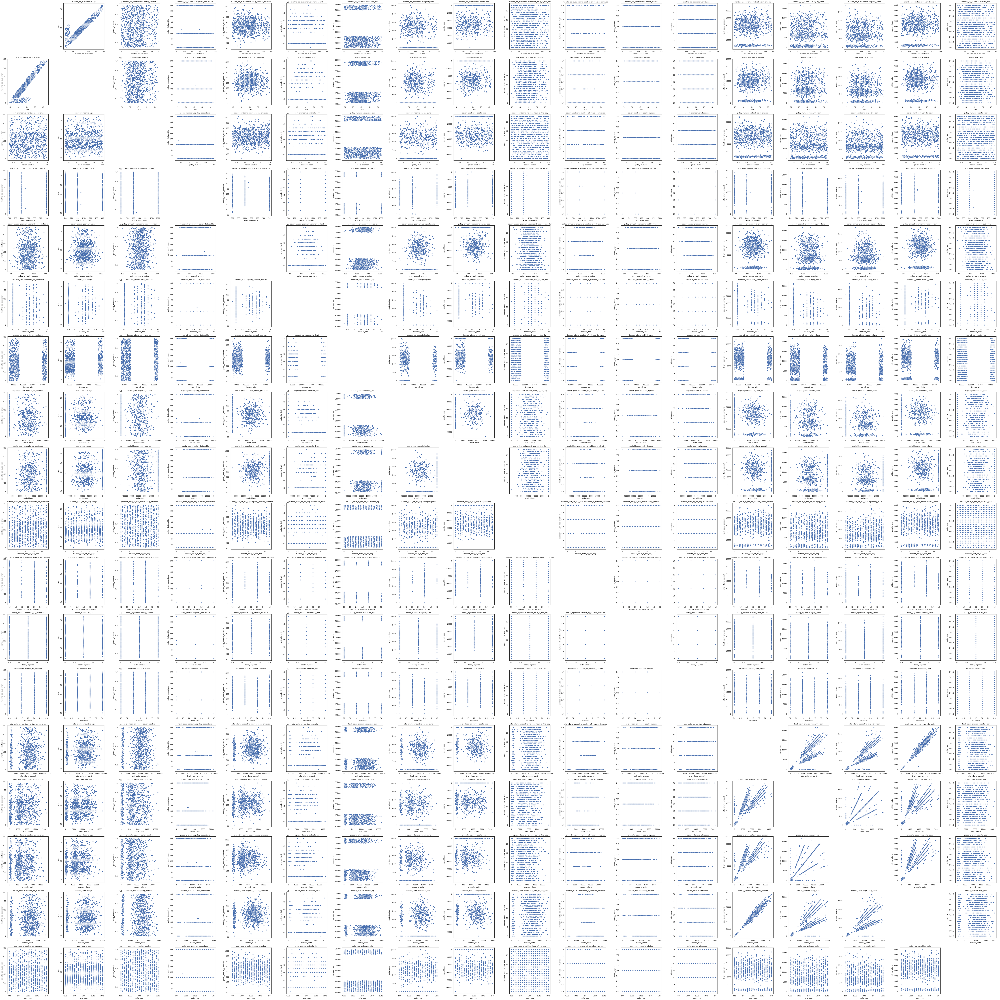

In [49]:
draw_scatter_plots(dataset)

In [50]:
non_numeric_columns = dataset.select_dtypes(exclude=['number']).columns

In [51]:
non_numeric_columns

Index(['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'incident_date', 'incident_type',
       'collision_type', 'incident_severity', 'authorities_contacted',
       'incident_state', 'incident_city', 'incident_location',
       'property_damage', 'police_report_available', 'auto_make', 'auto_model',
       'fraud_reported'],
      dtype='object')

In [59]:
non_numeric_dataset=dataset[non_numeric_columns]
non_numeric_dataset.describe()

,policy_bind_date,policy_state,policy_csl,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,incident_date,incident_type,...,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,property_damage,police_report_available,auto_make,auto_model,fraud_reported
count,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000,...,1000,1000,1000,1000,1000,1000,1000,1000,1000,1000
unique,951,3,3,2,7,14,20,6,60,4,...,4,5,7,7,1000,3,3,14,39,2
top,2006-01-01,OH,250/500,FEMALE,JD,machine-op-inspct,reading,own-child,2015-02-02,Multi-vehicle Collision,...,Minor Damage,Police,NY,Springfield,9935 4th Drive,?,?,Saab,RAM,N
freq,3,352,351,537,162,93,66,183,28,419,...,354,294,264,157,1,360,343,80,43,753


---
<a href=#six></a>
## **Modeling**
<a href=#cont>Back to Table of Contents</a>

* **Purpose:** Develop and train predictive or statistical models.
* **Details:** Describe the choice of models, feature selection and engineering processes, and show how the models are trained. Include code for setting up the models and explanations of the model parameters.
---


In [14]:
#Please use code cells to code in and do not forget to comment your code.

---
<a href=#seven></a>
## **Evaluation and Validation**
<a href=#cont>Back to Table of Contents</a>

* **Purpose:** Evaluate and validate the effectiveness and accuracy of the models.
* **Details:** Present metrics used to evaluate the models, such as accuracy, precision, recall, F1-score, etc. Discuss validation techniques employed, such as cross-validation or train/test split.
---

In [15]:
#Please use code cells to code in and do not forget to comment your code.

---
<a href=#eight></a>
## **Final Model**
<a href=#cont>Back to Table of Contents</a>

* **Purpose:** Present the final model and its performance.
* **Details:** Highlight the best-performing model and discuss its configuration, performance, and why it was chosen over others.
---


In [16]:
#Please use code cells to code in and do not forget to comment your code.

---
<a href=#nine></a>
## **Conclusion and Future Work**
<a href=#cont>Back to Table of Contents</a>

* **Purpose:** Summarize the findings and discuss future directions.
* **Details:** Conclude with a summary of the results, insights gained, limitations of the study, and suggestions for future projects or improvements in methodology or data collection.
---


In [17]:
#Please use code cells to code in and do not forget to comment your code.

---
<a href=#ten></a>
## **References**
<a href=#cont>Back to Table of Contents</a>

* **Purpose:** Provide citations and sources of external content.
* **Details:** List all the references and sources consulted during the project, including data sources, research papers, and documentation for tools and libraries used.
---

In [18]:
#Please use code cells to code in and do not forget to comment your code.

## Additional Sections to Consider

* ### Appendix: 
For any additional code, detailed tables, or extended data visualizations that are supplementary to the main content.

* ### Contributors: 
If this is a group project, list the contributors and their roles or contributions to the project.
